In [1]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
import cv2

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_colab = None

COLOR_SPACE = 'HSL' # Lab or HSL

In [2]:
path = r"./data/part3"
    
paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(123)
paths_subset = np.random.choice(paths, 1000, replace=False) # choosing 1000 images randomly
rand_idxs = np.random.permutation(1000)
train_idxs = rand_idxs[:800] # choosing the first 8000 as training set
val_idxs = rand_idxs[800:] # choosing last 2000 as validation set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

800 200


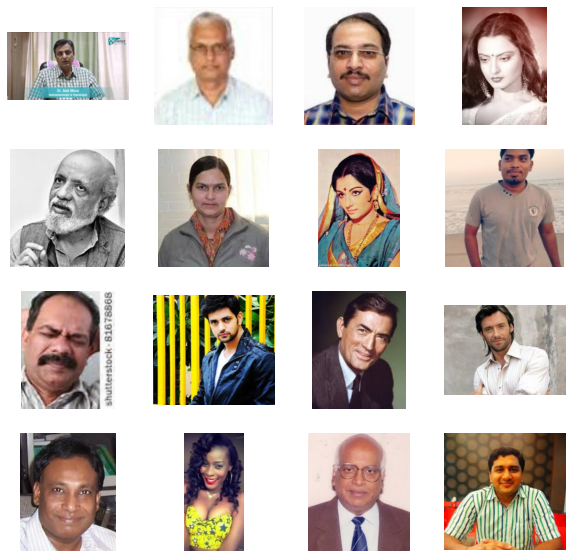

In [3]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [4]:
SIZE = 256
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train', color_space='Lab'):
        print(color_space)
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                # transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)
        self.color_space = color_space
        self.split = split
        self.size = SIZE
        self.paths = paths
    
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        return self.__transform_to_color_space(img) # Converting RGB to L*a*b

    def __transform_to_color_space(self, img):
        if self.color_space == 'Lab':
            img_lab = rgb2lab(img).astype("float32")
            img_lab = transforms.ToTensor()(img_lab)
            known_channel = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
            unknown_channels = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        elif self.color_space == 'HSL':
            img_hsl = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype("float32")
            #rgb2hsv(img).astype("float32")
            img_hsl = transforms.ToTensor()(img_hsl)
            h =  img_hsl[[0], ...] / 90. - 1.
            l =  (img_hsl[[1], ...] * 2.) / 255. - 1.
            s =  (img_hsl[[2], ...] * 2.) / 255. - 1.
            known_channel = l # Between -1 and 1
            unknown_channels = torch.cat([h, s]) # Between -1 and 1
        return {'known_channel': known_channel, 'unknown_channels': unknown_channels}

    
    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=0, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [5]:
train_dl = make_dataloaders(paths=train_paths, split='train', color_space=COLOR_SPACE)
val_dl = make_dataloaders(paths=val_paths, split='val', color_space=COLOR_SPACE)

data = next(iter(train_dl))
known_channels, unknown_channels_ = data['known_channel'], data['unknown_channels']
print(known_channels.shape, unknown_channels_.shape)
print(len(train_dl), len(val_dl))

HSL
HSL
torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
50 13


C:\Users\Tomek\AppData\Roaming\Python\Python39\site-packages\torchvision\transforms\transforms.py:257: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


In [6]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

In [7]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [8]:
PatchDiscriminator(3)

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

In [9]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

In [10]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [11]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [12]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        self.epoch = 0
        
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.known_channel = data['known_channel'].to(self.device)
        self.unknown_channels = data['unknown_channels'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.known_channel)
    
    def backward_D(self):
        fake_image = torch.cat([self.known_channel, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.known_channel, self.unknown_channels], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.known_channel, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.unknown_channels) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [13]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters() -> dict[str, AverageMeter]:
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def to_rgb(known_channel, unknown_channels):
    """
    Takes a batch of images
    """
    if COLOR_SPACE == 'Lab':
        L = (known_channel + 1.) * 50.
        ab = unknown_channels * 110.
        Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
        rgb_imgs = []
        for img in Lab:
            img_rgb = lab2rgb(img)
            rgb_imgs.append(img_rgb)
        return np.stack(rgb_imgs, axis=0)
    elif COLOR_SPACE == 'HSL':
        L = ((known_channel + 1.) / 2.) * 255.
        H = (unknown_channels[:, 0] + 1.) * 90.
        S = ((unknown_channels[:, 1] + 1.) / 2.) * 255.
        dim = H.size()
        H = torch.reshape(H, (dim[0], 1, dim[1], dim[2]))
        S = torch.reshape(S, (dim[0], 1, dim[1], dim[2]))

        HLS = torch.cat([H, L, S], dim=1).permute(0, 2, 3, 1).cpu().numpy()
        rgb_imgs = []
        for img in HLS:
            # print('hls')
            # print(img)
            img_rgb = cv2.cvtColor(np.uint8(img), cv2.COLOR_HLS2RGB)
            # print('rgb')
            # print(img_rgb)
            rgb_imgs.append(img_rgb)
        return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.unknown_channels
    known_channel = model.known_channel
    fake_imgs = to_rgb(known_channel, fake_color)
    real_imgs = to_rgb(known_channel, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(known_channel[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

In [14]:
def save_model(model: MainModel, epoch, loss_meter_dict: dict[str, AverageMeter]):
    torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict_G': model.opt_G.state_dict(),
            'optimizer_state_dict_D': model.opt_D.state_dict(),
            'losses': loss_meter_dict
            }, PATH)

def load_model(PATH, model):
    checkpoint = torch.load(PATH)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.opt_D.load_state_dict(checkpoint['optimizer_state_dict_D'])
    model.opt_G.load_state_dict(checkpoint['optimizer_state_dict_G'])
    epoch = checkpoint['epoch']
    model.epoch = epoch
    print(model.epoch)
    loss_meter_dict = checkpoint['losses']
    return model, loss_meter_dict

model initialized with norm initialization
model initialized with norm initialization


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 1/10
Iteration 10/50
loss_D_fake: 0.81847
loss_D_real: 0.81889
loss_D: 0.81868
loss_G_GAN: 1.00612
loss_G_L1: 61.00972
loss_G: 62.01584


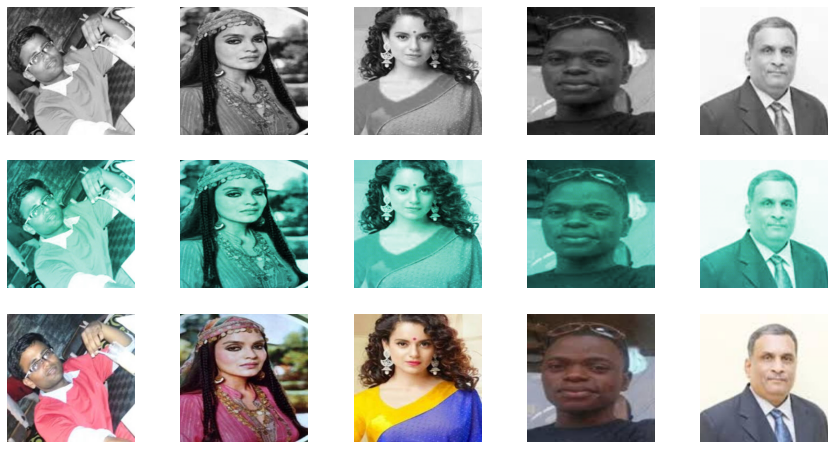


Epoch 1/10
Iteration 20/50
loss_D_fake: 0.71997
loss_D_real: 0.72502
loss_D: 0.72249
loss_G_GAN: 1.03119
loss_G_L1: 56.09245
loss_G: 57.12363


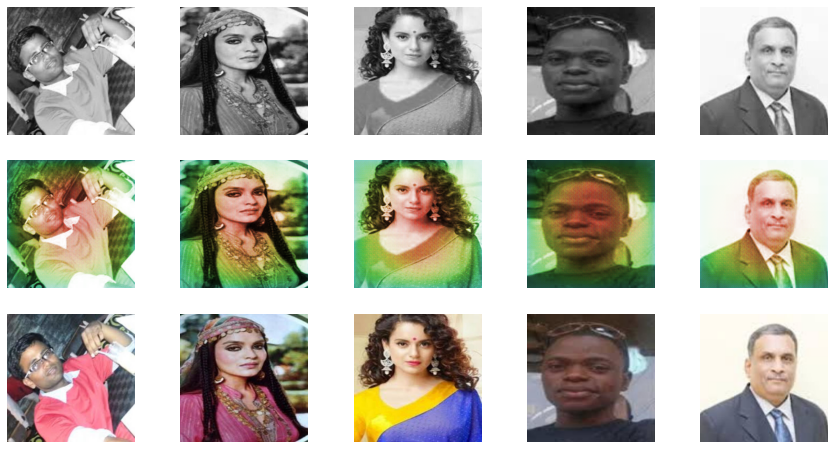


Epoch 1/10
Iteration 30/50
loss_D_fake: 0.64671
loss_D_real: 0.65693
loss_D: 0.65182
loss_G_GAN: 1.08667
loss_G_L1: 53.56754
loss_G: 54.65421


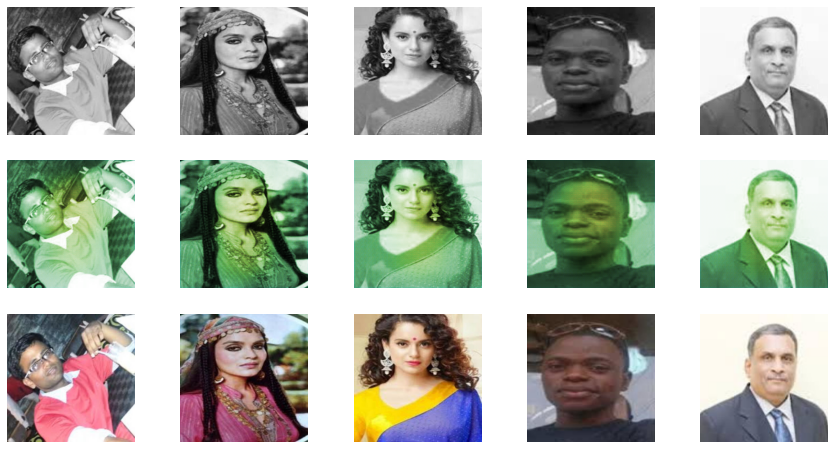


Epoch 1/10
Iteration 40/50
loss_D_fake: 0.57818
loss_D_real: 0.59423
loss_D: 0.58621
loss_G_GAN: 1.21114
loss_G_L1: 51.48191
loss_G: 52.69305


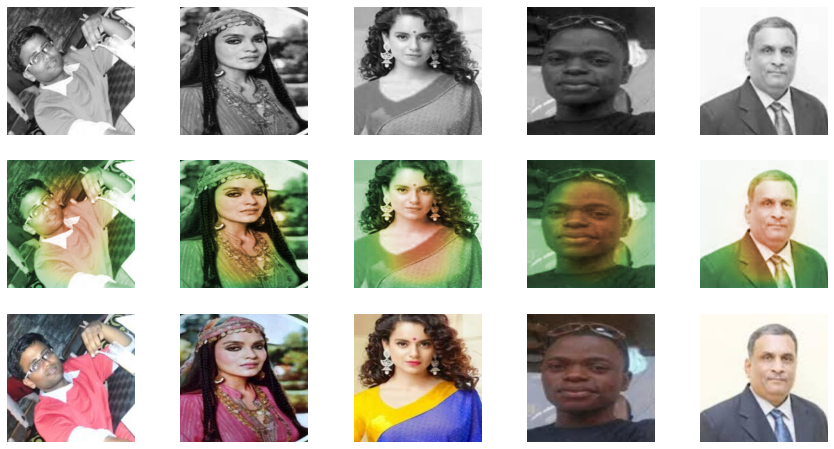


Epoch 1/10
Iteration 50/50
loss_D_fake: 0.51184
loss_D_real: 0.53068
loss_D: 0.52126
loss_G_GAN: 1.39469
loss_G_L1: 49.70063
loss_G: 51.09532


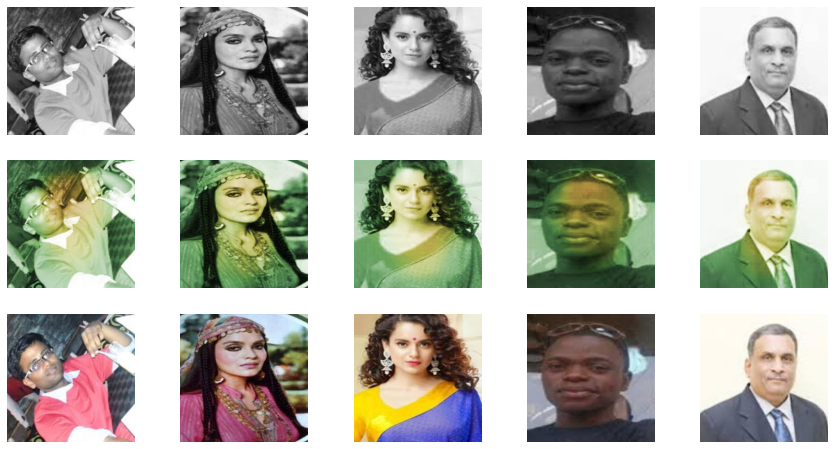

  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 2/10
Iteration 10/50
loss_D_fake: 0.11769
loss_D_real: 0.12710
loss_D: 0.12239
loss_G_GAN: 2.74507
loss_G_L1: 43.79537
loss_G: 46.54044


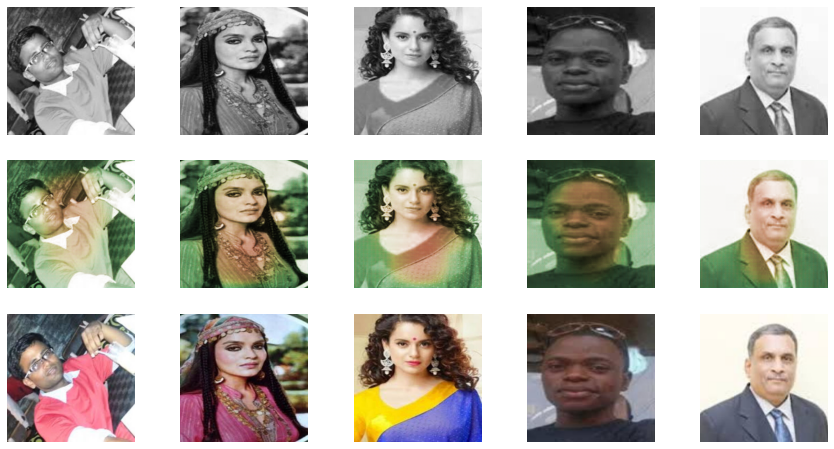


Epoch 2/10
Iteration 20/50
loss_D_fake: 0.09130
loss_D_real: 0.09982
loss_D: 0.09556
loss_G_GAN: 2.92792
loss_G_L1: 42.97847
loss_G: 45.90639


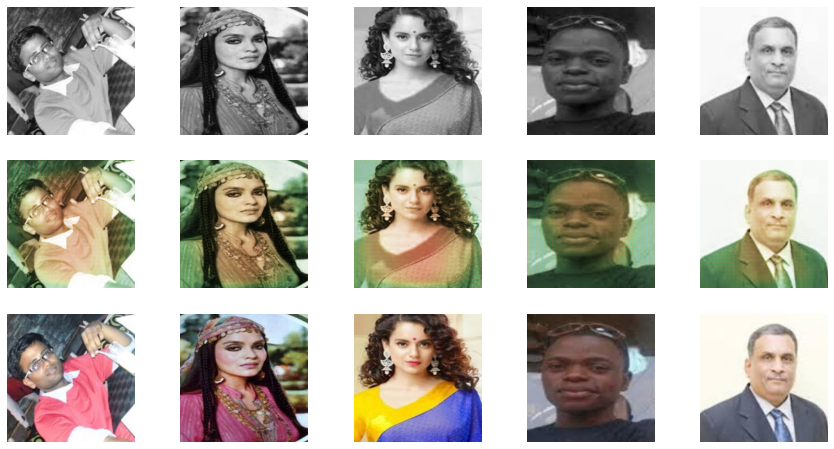


Epoch 2/10
Iteration 30/50
loss_D_fake: 0.07838
loss_D_real: 0.08733
loss_D: 0.08285
loss_G_GAN: 3.07599
loss_G_L1: 43.05438
loss_G: 46.13037


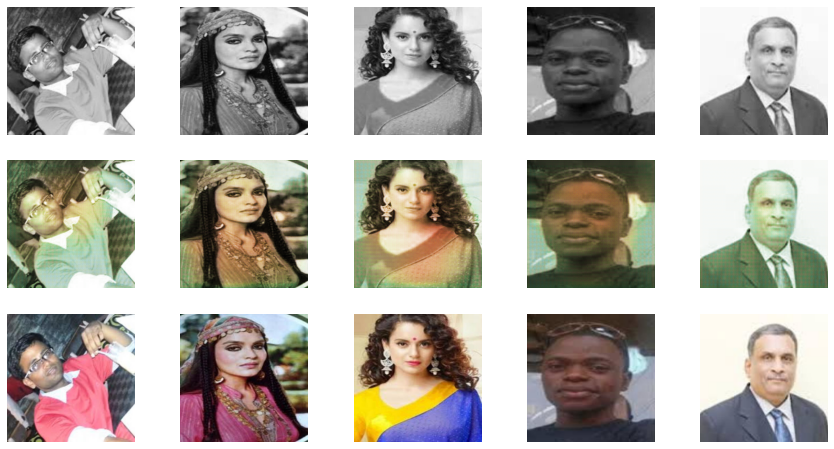


Epoch 2/10
Iteration 40/50
loss_D_fake: 0.06860
loss_D_real: 0.07639
loss_D: 0.07250
loss_G_GAN: 3.23516
loss_G_L1: 43.25491
loss_G: 46.49006


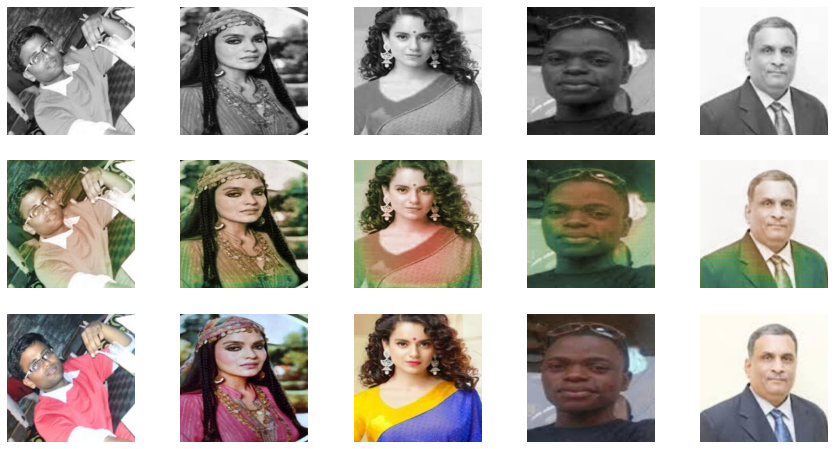


Epoch 2/10
Iteration 50/50
loss_D_fake: 0.07185
loss_D_real: 0.07524
loss_D: 0.07355
loss_G_GAN: 3.31038
loss_G_L1: 42.95738
loss_G: 46.26776


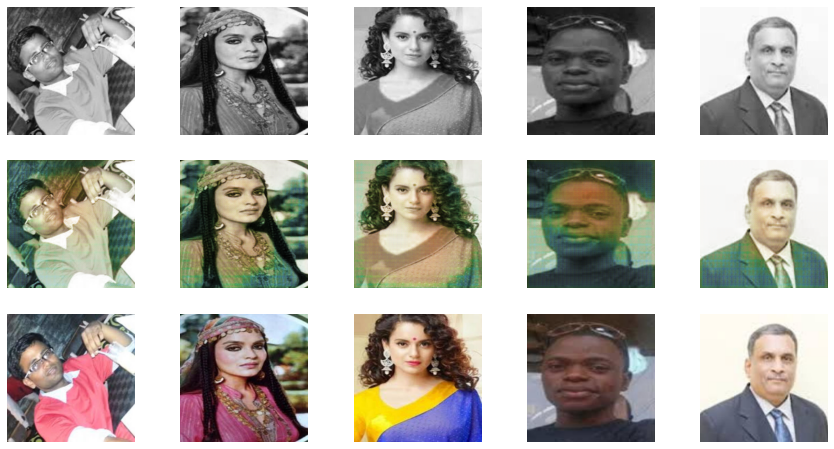

  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 3/10
Iteration 10/50
loss_D_fake: 0.36110
loss_D_real: 0.38933
loss_D: 0.37522
loss_G_GAN: 3.42483
loss_G_L1: 43.23881
loss_G: 46.66364


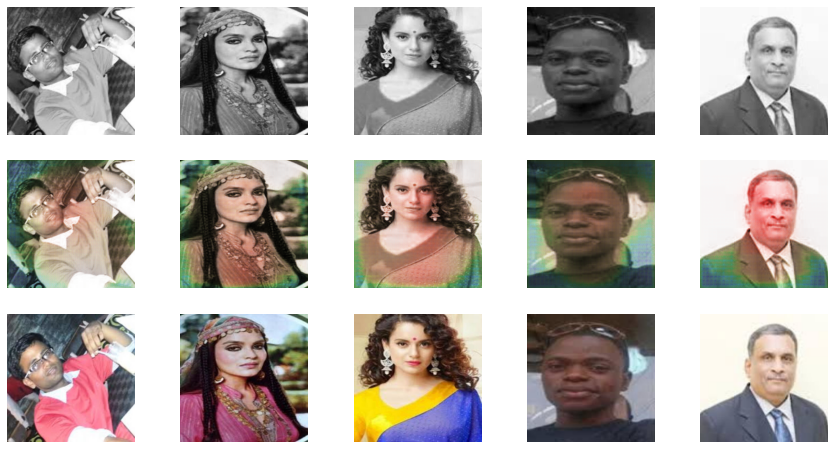


Epoch 3/10
Iteration 20/50
loss_D_fake: 0.21608
loss_D_real: 0.24031
loss_D: 0.22820
loss_G_GAN: 3.41369
loss_G_L1: 42.95187
loss_G: 46.36556


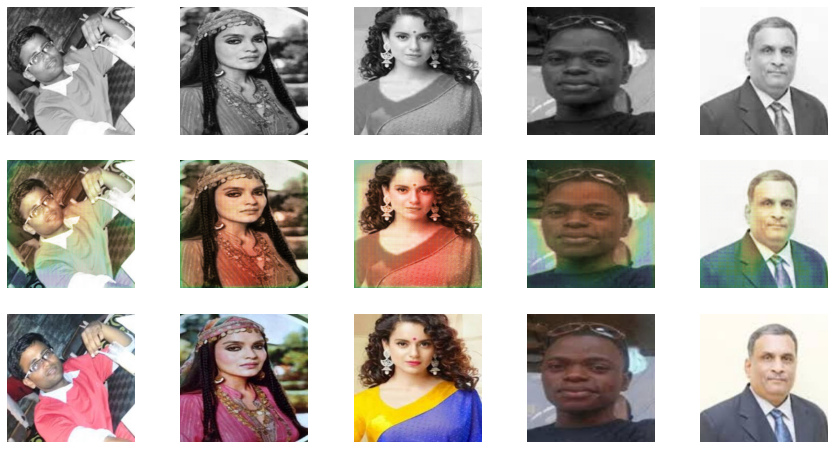


Epoch 3/10
Iteration 30/50
loss_D_fake: 0.15904
loss_D_real: 0.17725
loss_D: 0.16815
loss_G_GAN: 3.50318
loss_G_L1: 42.99256
loss_G: 46.49574


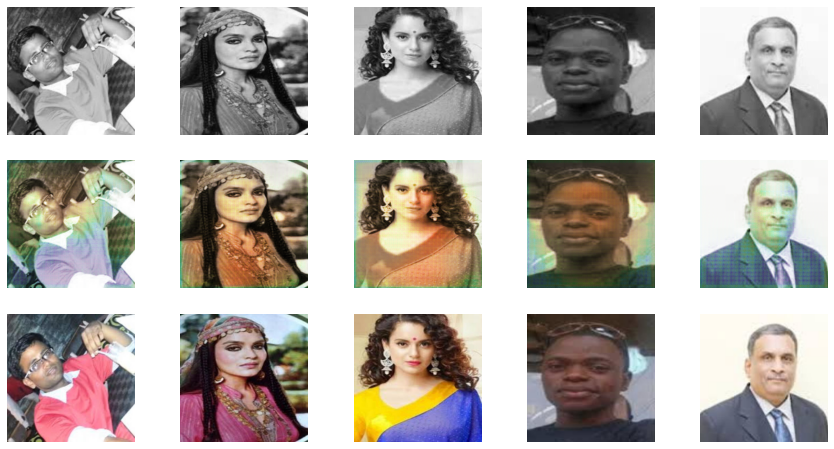


Epoch 3/10
Iteration 40/50
loss_D_fake: 0.20137
loss_D_real: 0.18532
loss_D: 0.19335
loss_G_GAN: 3.47739
loss_G_L1: 43.28242
loss_G: 46.75981


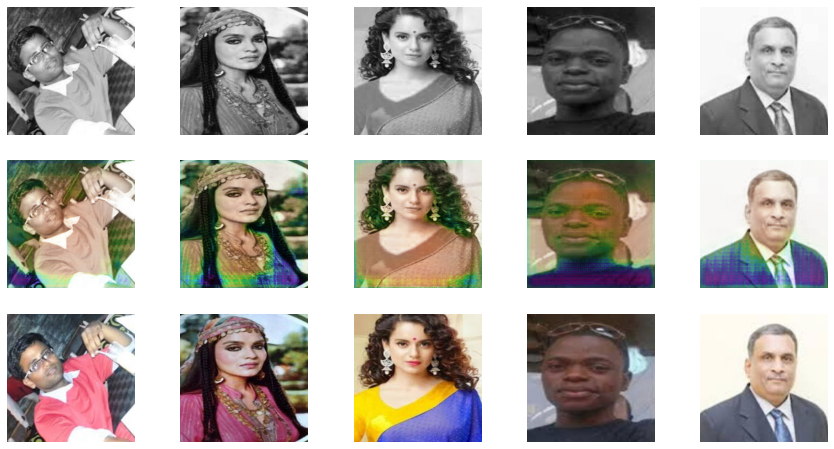


Epoch 3/10
Iteration 50/50
loss_D_fake: 0.23435
loss_D_real: 0.24330
loss_D: 0.23883
loss_G_GAN: 3.18044
loss_G_L1: 43.15271
loss_G: 46.33315


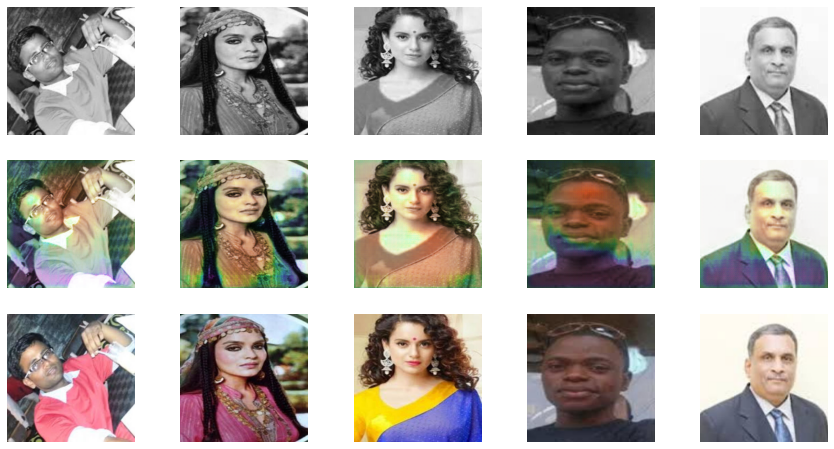

  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 4/10
Iteration 10/50
loss_D_fake: 0.26471
loss_D_real: 0.33117
loss_D: 0.29794
loss_G_GAN: 2.69430
loss_G_L1: 43.08148
loss_G: 45.77577


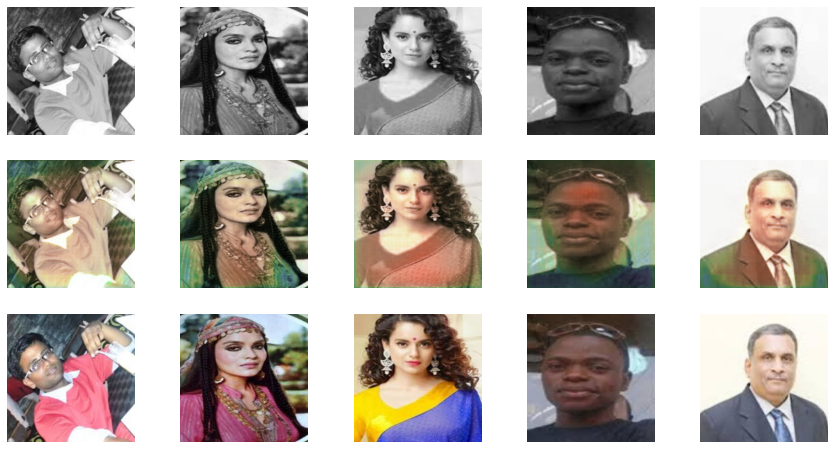


Epoch 4/10
Iteration 20/50
loss_D_fake: 0.20490
loss_D_real: 0.23091
loss_D: 0.21790
loss_G_GAN: 2.73434
loss_G_L1: 42.49779
loss_G: 45.23213


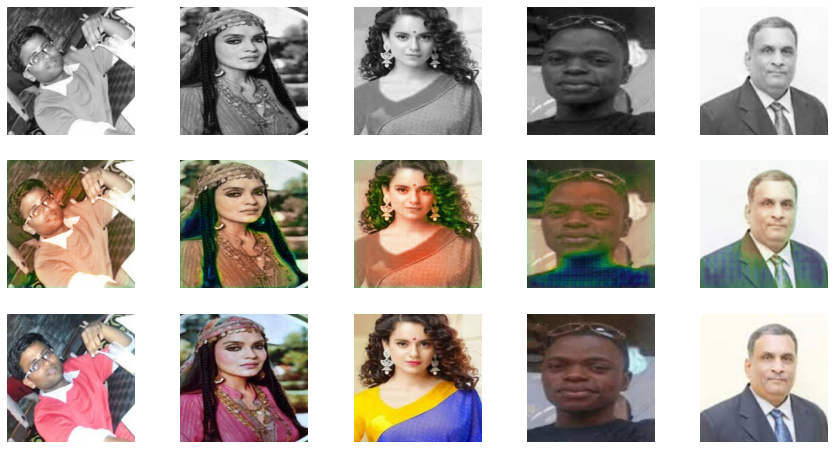


Epoch 4/10
Iteration 30/50
loss_D_fake: 0.19452
loss_D_real: 0.22564
loss_D: 0.21008
loss_G_GAN: 2.69013
loss_G_L1: 42.86398
loss_G: 45.55412


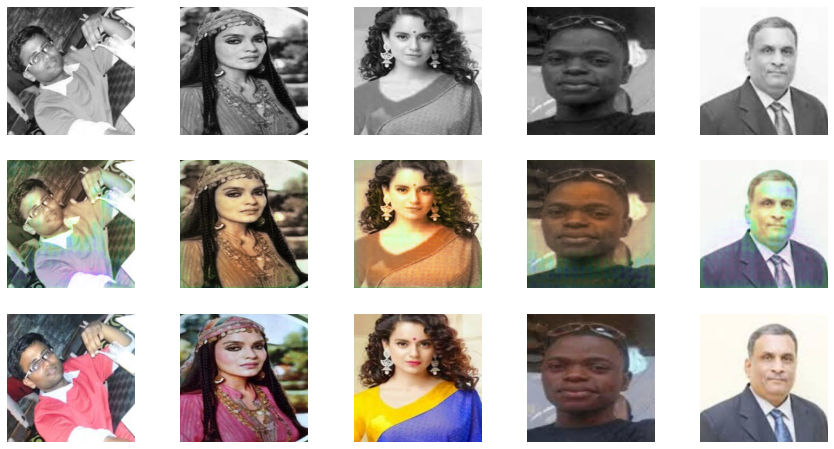


Epoch 4/10
Iteration 40/50
loss_D_fake: 0.19800
loss_D_real: 0.21240
loss_D: 0.20520
loss_G_GAN: 2.82364
loss_G_L1: 43.03006
loss_G: 45.85370


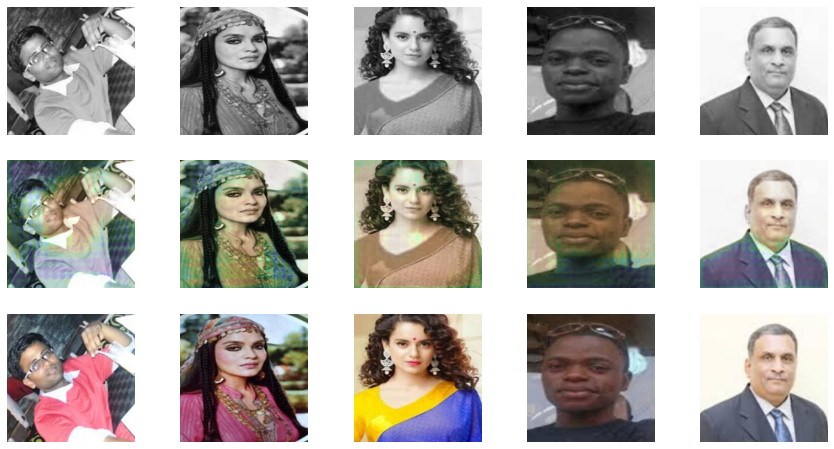


Epoch 4/10
Iteration 50/50
loss_D_fake: 0.21365
loss_D_real: 0.22971
loss_D: 0.22168
loss_G_GAN: 2.71893
loss_G_L1: 42.72835
loss_G: 45.44728


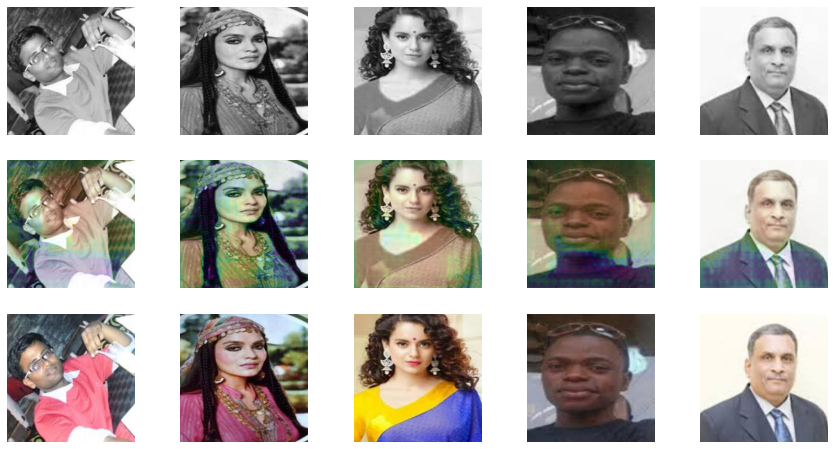

  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 5/10
Iteration 10/50
loss_D_fake: 0.13373
loss_D_real: 0.15615
loss_D: 0.14494
loss_G_GAN: 2.89713
loss_G_L1: 42.61215
loss_G: 45.50928


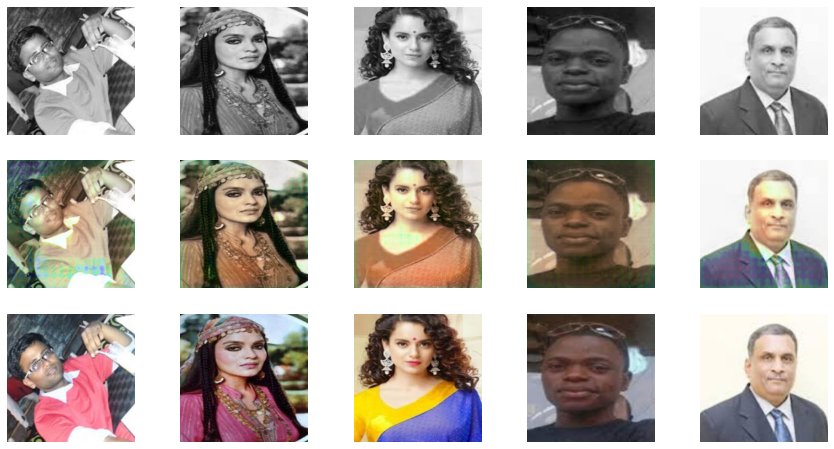

In [15]:
def train_model(model, train_dl, epochs, display_every=200):
    viz_data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['known_channel'].size(0)) # function updating the log objects
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, viz_data, save=False) # function displaying the model's outputs
model = MainModel()
train_model(model, train_dl, 2, 10)